<a href="https://colab.research.google.com/github/Hyeonseo-Lee/INGPS_Demo/blob/master/INGPS.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [15]:
!pip -q install kagglehub

In [16]:

import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import kagglehub
import numpy as np

# 1) Kaggle 데이터셋 다운로드
path = kagglehub.dataset_download("wkirgsn/electric-motor-temperature")
print("Path to dataset files:", path)

csv_path = f"{path}/measures_v2.csv"
data = pd.read_csv(csv_path)


Path to dataset files: /kaggle/input/electric-motor-temperature


In [17]:


# 2) 기본 설정
dt = 0.5  # 2 Hz 샘플링 → 0.5초
time = (data.index.values * dt)


In [18]:

# profile_id 별 분리 (등장 순서 유지)
profiles = {}
for pid in data["profile_id"].unique():
    mask = (data["profile_id"] == pid).values
    Tpid = data.loc[mask].copy()
    Tpid["time_abs"] = time[mask]
    Tpid["time_rel"] = np.arange(len(Tpid)) * dt
    profiles[pid] = Tpid

# 사용할 변수 순서 (MATLAB 코드와 동일)
vars_order = [
    'u_q','coolant','stator_winding','u_d','stator_tooth',
    'motor_speed','i_d','i_q','pm','stator_yoke','ambient','torque'
]


In [19]:

# ===== 옵션 =====
# 1) 표시할 프로파일 선택: 전체면 아래 한 줄만 사용
pids_to_plot = list(profiles.keys())  # 전체
# pids_to_plot = [17, 52]  # 예시: 특정 프로파일만 보고 싶을 때

# 2) 다운샘플링 간격 (1=그대로, 2=절반, 5=1/5 …)
ds = 1


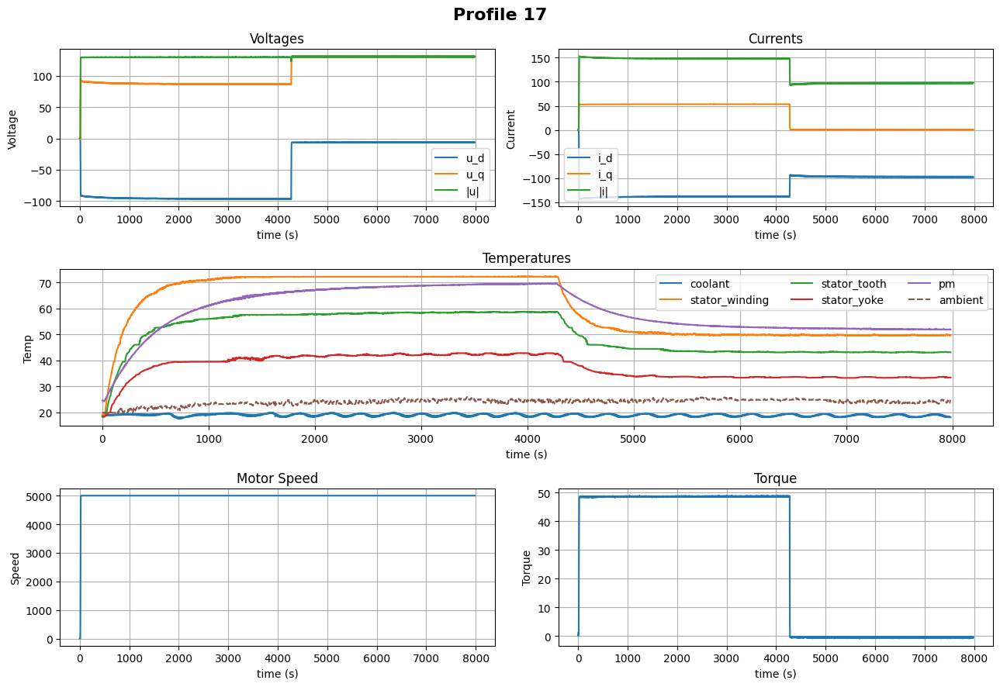

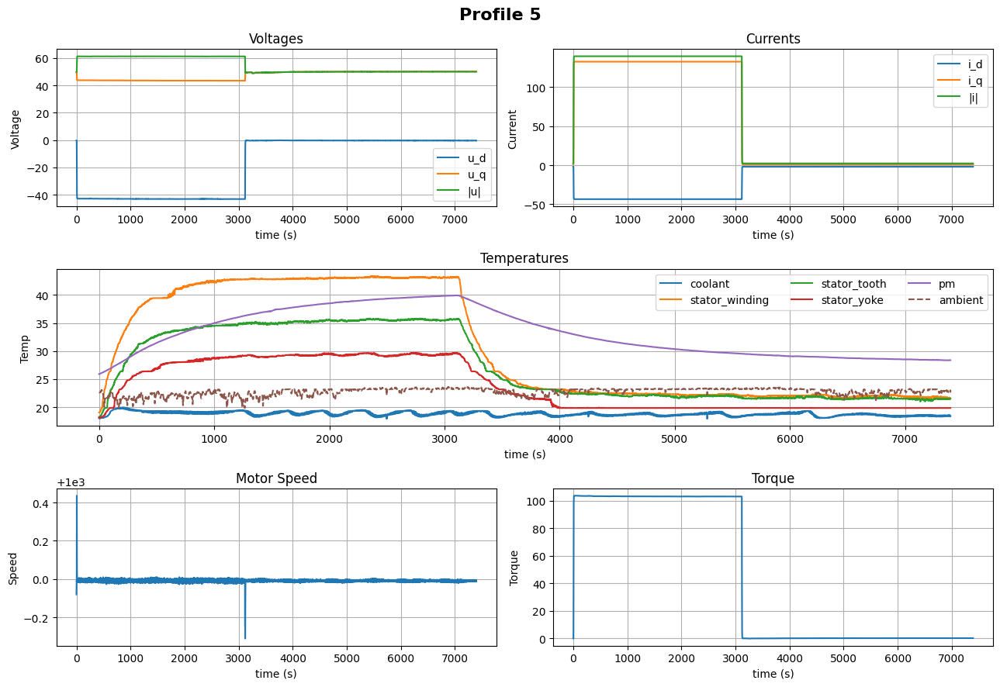

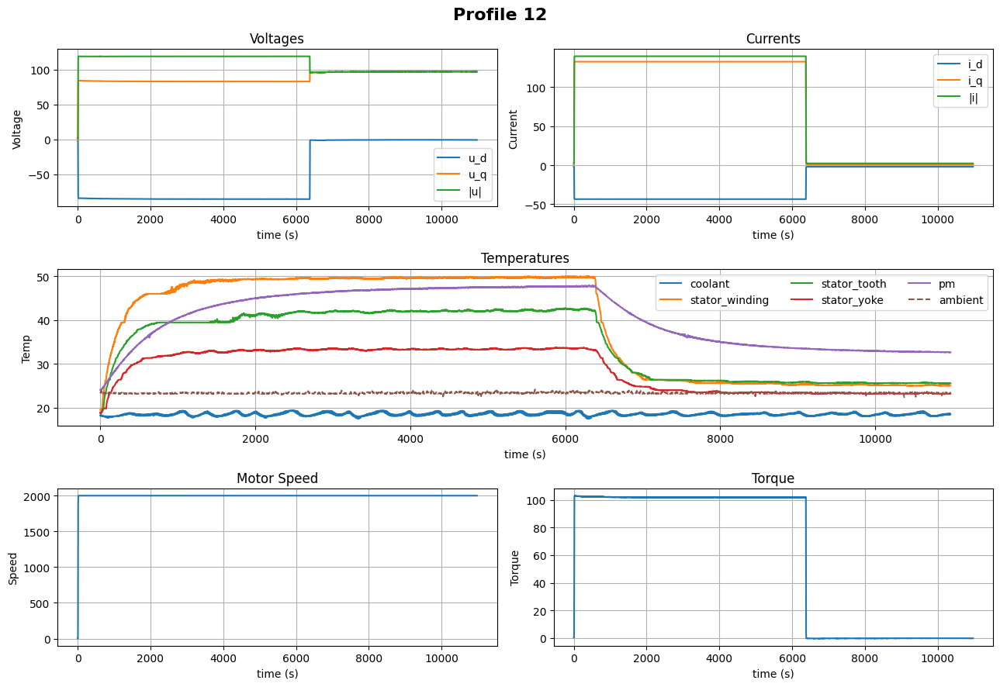

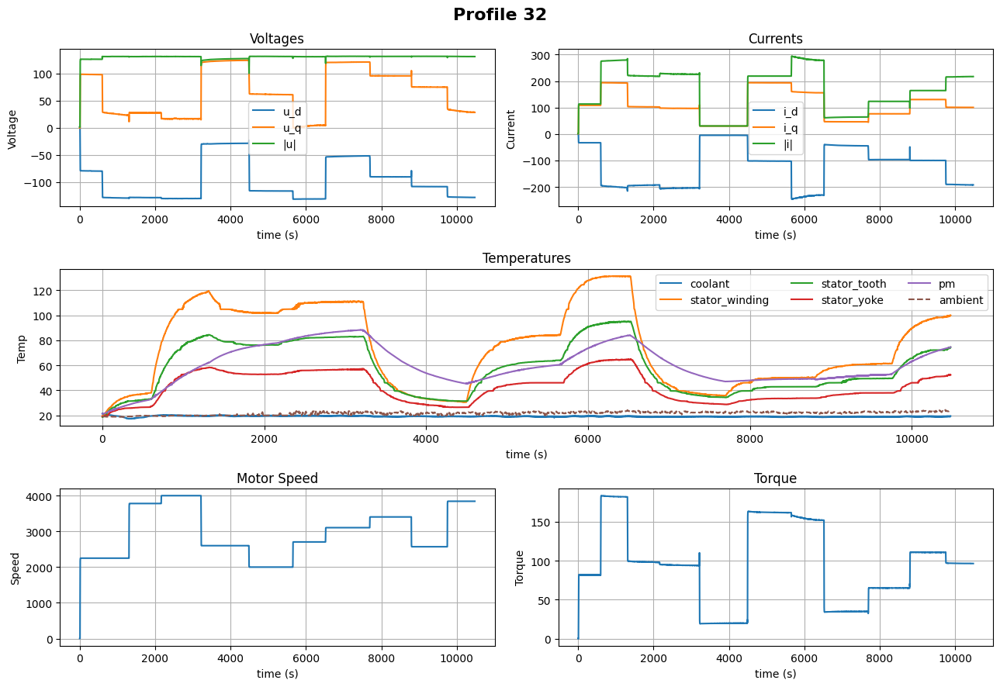

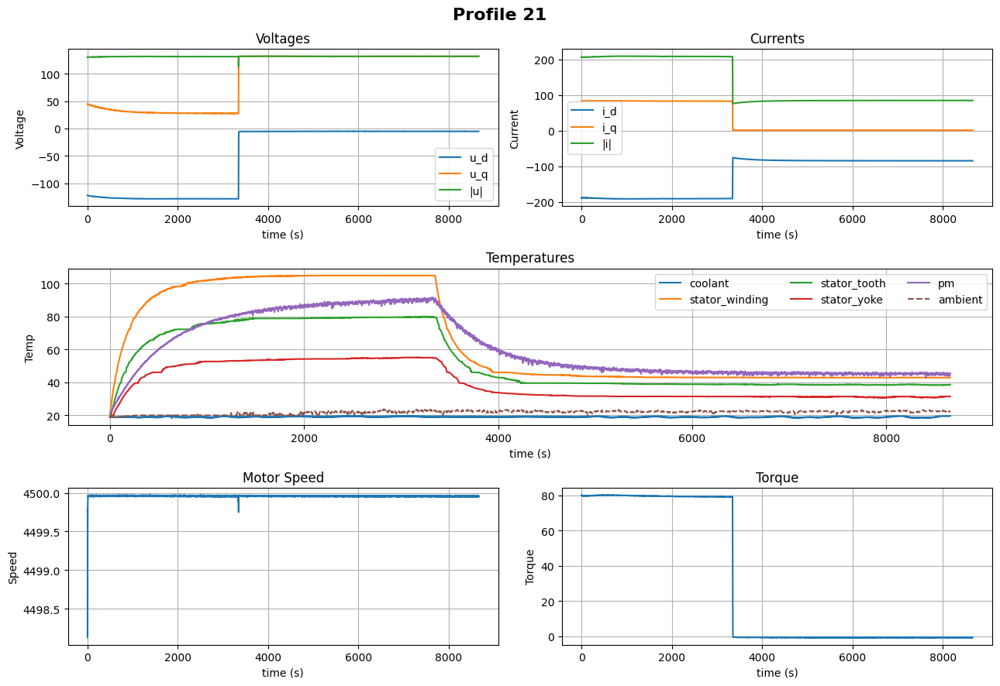

...

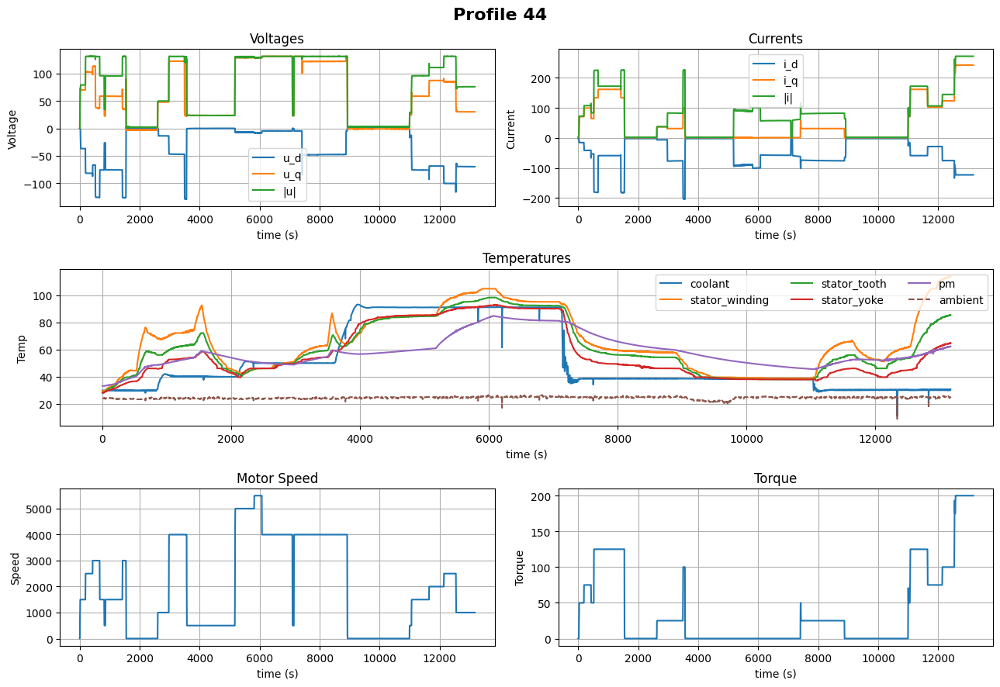

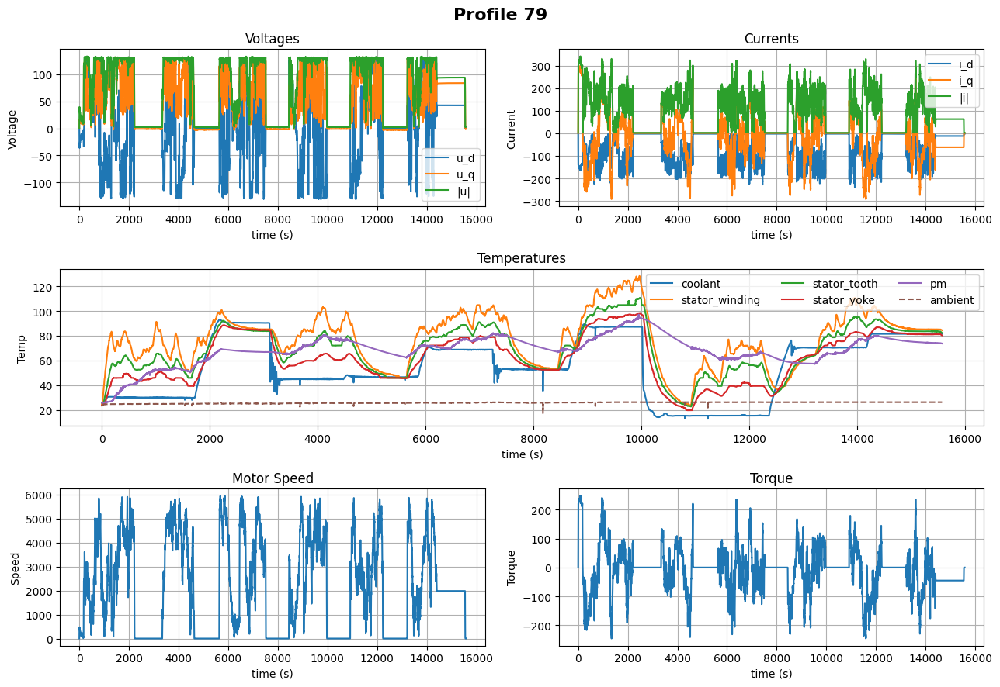

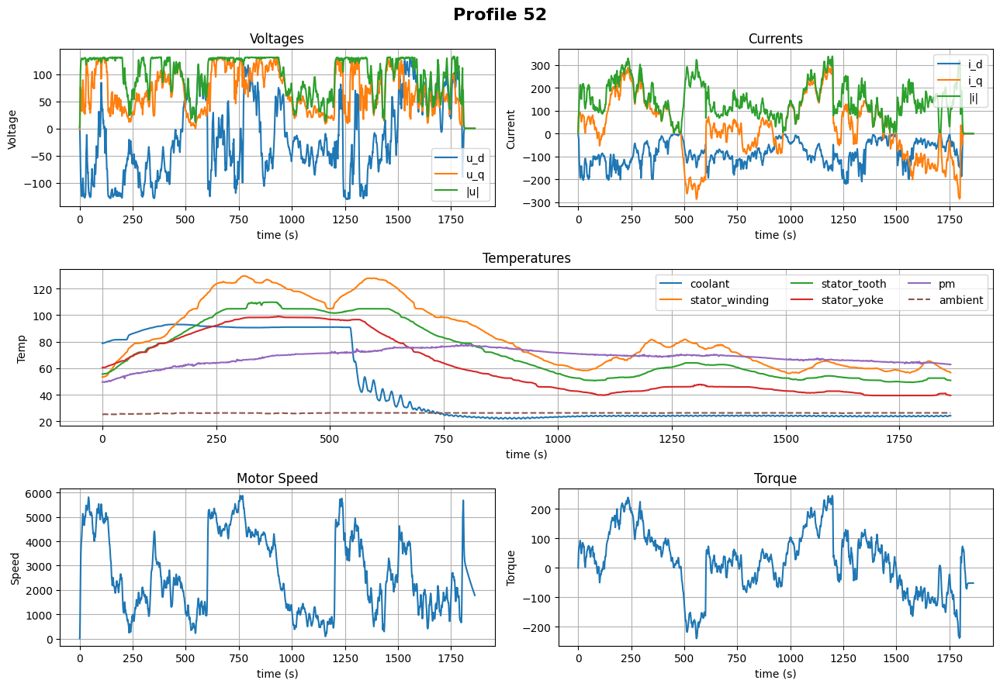

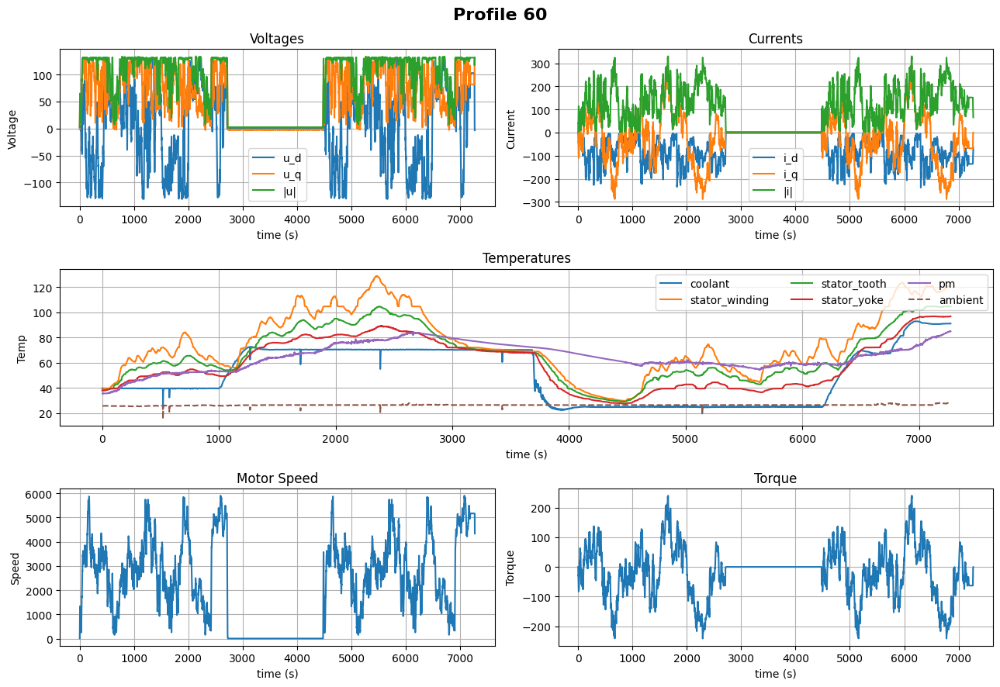

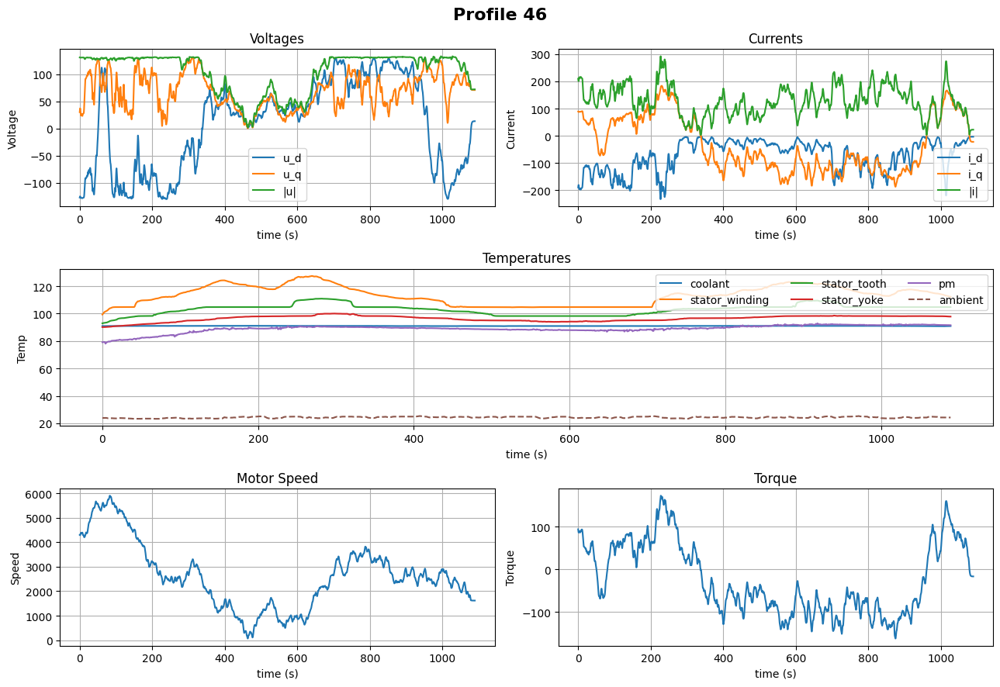

In [ ]:

# ===== 순차 표시 =====
for pid in pids_to_plot:
    T = profiles[pid]
    Tsel = T[vars_order].copy()
    Tsel["time"] = T["time_rel"].values

    # 다운샘플링 인덱스
    idx = slice(None, None, ds)
    t = Tsel["time"].values[idx]

    u_d = Tsel["u_d"].values[idx]
    u_q = Tsel["u_q"].values[idx]
    i_d = Tsel["i_d"].values[idx]
    i_q = Tsel["i_q"].values[idx]
    u_mag = np.hypot(u_d, u_q)
    i_mag = np.hypot(i_d, i_q)

    coolant        = Tsel["coolant"].values[idx]
    stator_winding = Tsel["stator_winding"].values[idx]
    stator_tooth   = Tsel["stator_tooth"].values[idx]
    stator_yoke    = Tsel["stator_yoke"].values[idx]
    pm             = Tsel["pm"].values[idx]
    ambient        = Tsel["ambient"].values[idx]
    motor_speed    = Tsel["motor_speed"].values[idx]
    torque         = Tsel["torque"].values[idx]

    # Figure
    fig = plt.figure(figsize=(13, 9))
    gs = gridspec.GridSpec(3, 2, figure=fig)
    fig.suptitle(f'Profile {pid}', fontsize=16, fontweight="bold")

    # 1) 전압
    ax1 = fig.add_subplot(gs[0, 0])
    ax1.plot(t, u_d, label="u_d")
    ax1.plot(t, u_q, label="u_q")
    ax1.plot(t, u_mag, label="|u|")
    ax1.set_title("Voltages")
    ax1.set_xlabel("time (s)")
    ax1.set_ylabel("Voltage")
    ax1.grid(True)
    ax1.legend()

    # 2) 전류
    ax2 = fig.add_subplot(gs[0, 1])
    ax2.plot(t, i_d, label="i_d")
    ax2.plot(t, i_q, label="i_q")
    ax2.plot(t, i_mag, label="|i|")
    ax2.set_title("Currents")
    ax2.set_xlabel("time (s)")
    ax2.set_ylabel("Current")
    ax2.grid(True)
    ax2.legend()

    # 3) 온도 (가로 2칸)
    ax3 = fig.add_subplot(gs[1, :])
    ax3.plot(t, coolant, label="coolant")
    ax3.plot(t, stator_winding, label="stator_winding")
    ax3.plot(t, stator_tooth, label="stator_tooth")
    ax3.plot(t, stator_yoke, label="stator_yoke")
    ax3.plot(t, pm, label="pm")
    ax3.plot(t, ambient, "--", label="ambient")
    ax3.set_title("Temperatures")
    ax3.set_xlabel("time (s)")
    ax3.set_ylabel("Temp")
    ax3.grid(True)
    ax3.legend(ncol=3, loc="upper right")

    # 4) 속도
    ax4 = fig.add_subplot(gs[2, 0])
    ax4.plot(t, motor_speed)
    ax4.set_title("Motor Speed")
    ax4.set_xlabel("time (s)")
    ax4.set_ylabel("Speed")
    ax4.grid(True)

    # 5) 토크
    ax5 = fig.add_subplot(gs[2, 1])
    ax5.plot(t, torque)
    ax5.set_title("Torque")
    ax5.set_xlabel("time (s)")
    ax5.set_ylabel("Torque")
    ax5.grid(True)

    plt.tight_layout()
    plt.show()
    plt.close(fig)  # 메모리 확보용




NameError: name 'pids_to_plot' is not defined